# Import of Libraries

In [34]:
import os
import cv2
import numpy as np
import glob
import time
import matplotlib.pyplot as plt
import pandas as pd
from tabulate import tabulate
from IPython.display import display, HTML
from colorama import Fore, Style

import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# **Assignment 1 - M&Ms**
<br>
University of Porto - School of Engineering <br>
Master’s degree in Data Science & Engineering (MECD) – FEUP<br>
<br>
Computer Vision - CV<br>
October 2023 <br>
<br>
Authors: Paulo Portela (up202200871) and Luís Henriques (up202204386)
<br>

# **Context**

The quality assurance tester of a M&M factory retrieves a sample from the
production every hour to determine some properties of chocolate peanuts. The
factory uses a computer vision application to automatically calculate some
properties of the sample, namely:
- the distribution of each color in the sample, e.g., the number of red (or
blue or …) chocolates. At the end, if the sample does not have chocolate
peanuts of all colors, the system must raise an alarm by printing “Color
XPTO is missing”;
- the average shape area of all chocolate peanuts in millimeters and
organized by color.


# Exercises Resolution

In [35]:
def DetectChessboardCorners(num_cols, num_rows, images):
    
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((num_cols * num_rows, 3), np.float32)
    objp[:,:2] = np.mgrid[0:num_cols, 0:num_rows].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (num_cols, num_rows), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (num_cols, num_rows), corners, ret)
            plt.imshow(img)
            plt.show()
            time.sleep(1)

    return objpoints, imgpoints


def DistortedVSNonDistorted(objpoints, imgpoints, image):

    img_size = (image.shape[1], image.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

    dst = cv2.undistort(image, mtx, dist, None, mtx)

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)

    return mtx, dist, rvecs, tvecs

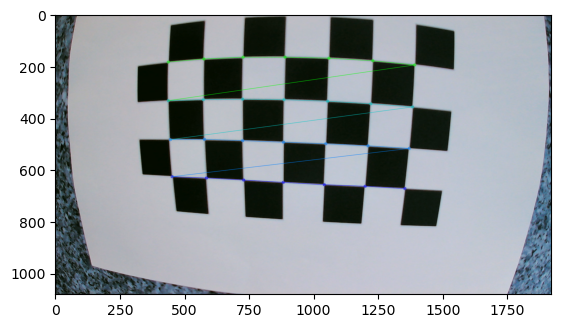

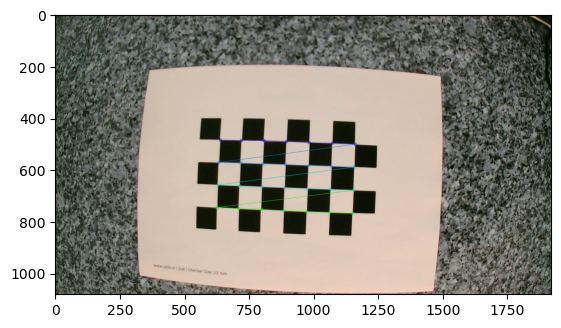

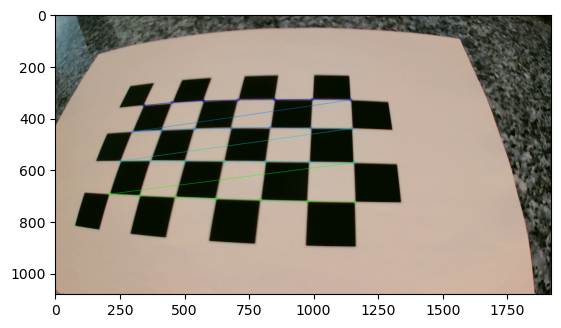

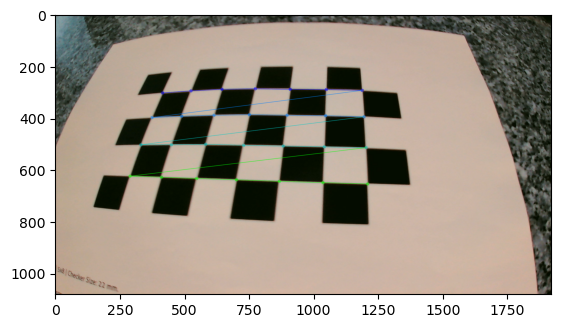

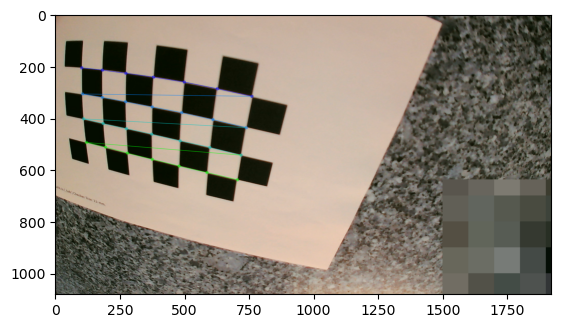

...

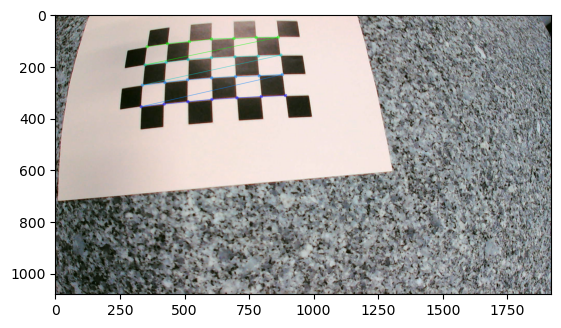

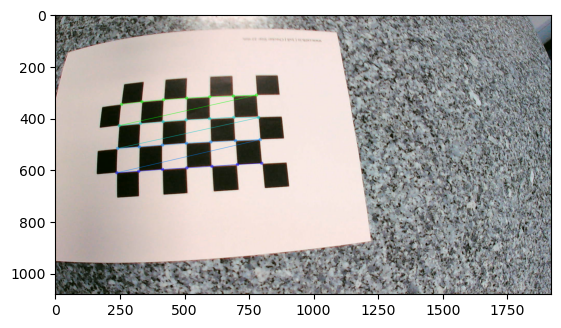

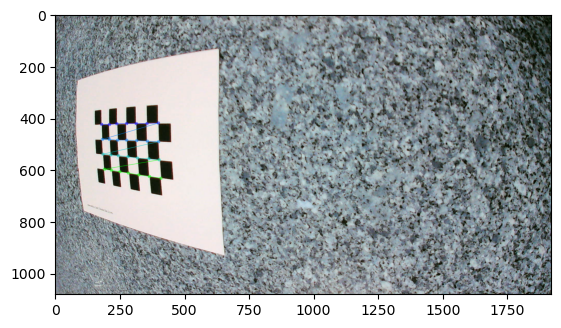

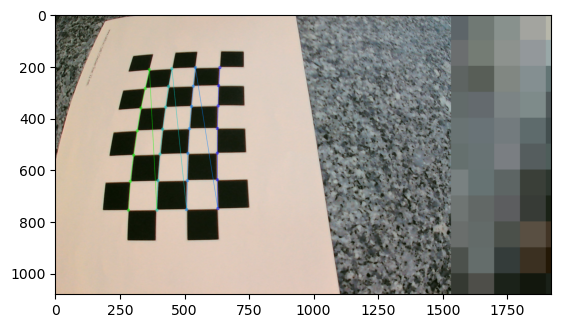

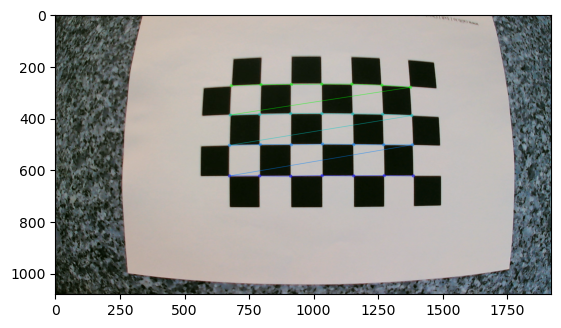

In [36]:
#Make a list of calibration images
images = glob.glob('IntrinsicCalibration/*.png')
images.append('WhiteBackground/extrinsic.png')

objpoints, imgpoints = DetectChessboardCorners(num_cols = 7, num_rows = 4, images = images)

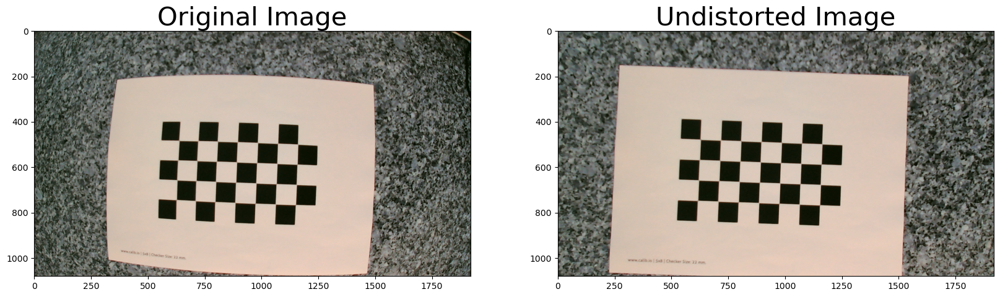

In [37]:
img = cv2.imread('IntrinsicCalibration/calib_img 1.png')

intrinsic_matrix, dist_coef, rotation_vectors, translation_vectors = DistortedVSNonDistorted(objpoints = objpoints, imgpoints = imgpoints, image = img)

## 1. Calibrate the intrinsic parameters and lens distortion of the camera. Show the intrinsic matrix and the lens distortion coefficients.

#### **Intrinsic Matrix, Focal Length, Main Points (x and y), Skew, Radial Distortion Coefficients (K1, K2 and K3) and Tangential Distortion Coefficients (P1 and P2)**

In [38]:
# Format an intrinsic matrix
intrinsic_matrix_formatted = np.array2string(intrinsic_matrix, formatter={'all': lambda x: f"{x:.2f}"}, separator=', ', suppress_small=True)

# Format the distortion coefficient
dist_coef_coefficient = np.array2string(dist_coef, formatter={'all': lambda x: f"{x:.2f}"}, separator=', ', suppress_small=True)
focal_length_x = intrinsic_matrix[0, 0]
focal_length_y = intrinsic_matrix[1, 1]
main_point_x = intrinsic_matrix[0, 2]
main_point_y = intrinsic_matrix[1, 2]
skew = intrinsic_matrix[0, 1]
k1 = dist_coef[0, 0]
k2 = dist_coef[0, 1]
p1 = dist_coef[0, 2]
p2 = dist_coef[0, 3]
k3 = dist_coef[0, 4]

# Create a list of lists with the data
table_data = [
    ["Intrinsic Matrix", intrinsic_matrix_formatted],
    ["Focal Length (x)", f"{focal_length_x:.2f}"],
    ["Focal Length (y)", f"{focal_length_y:.2f}"],
    ["Main point (x)", f"{main_point_x:.2f}"],
    ["Main point (y)", f"{main_point_y:.2f}"],
    ["Skew", f"{skew:.2f}"],
    ["K1", f"{k1:.2f}"],
    ["K2", f"{k2:.2f}"],
    ["K3", f"{k3:.2f}"],
    ["P1", f"{p1:.2f}"],
    ["P2", f"{p2:.2f}"],
]

# Print the formatted table
print(tabulate(table_data, headers=["Description", "Value"],  tablefmt="fancy_grid"))

╒══════════════════╤═══════════════════════════╕
│ Description      │ Value                     │
╞══════════════════╪═══════════════════════════╡
│ Intrinsic Matrix │ [[1323.93, 0.00, 992.45], │
│                  │  [0.00, 1324.08, 634.59], │
│                  │  [0.00, 0.00, 1.00]]      │
├──────────────────┼───────────────────────────┤
│ Focal Length (x) │ 1323.93                   │
├──────────────────┼───────────────────────────┤
│ Focal Length (y) │ 1324.08                   │
├──────────────────┼───────────────────────────┤
│ Main point (x)   │ 992.45                    │
├──────────────────┼───────────────────────────┤
│ Main point (y)   │ 634.59                    │
├──────────────────┼───────────────────────────┤
│ Skew             │ 0.00                      │
├──────────────────┼───────────────────────────┤
│ K1               │ -0.35                     │
├──────────────────┼───────────────────────────┤
│ K2               │ 0.11                      │
├──────────────────┼

## 2. Calibrate the extrinsic parameters of the camera setup (or instead, use the  extrinsic  image  to  manually  measure  the  dimensions  of  a  black square  of  the  chessboard  in  pixels.  In  this  way,  you  will  know  the conversion between pixel to millimeter). Show the extrinsic matrix (rotation,  translation,  etc)  and/or  the  conversion  ratio  between  pixel to millimeter that was used (appear in section 3 and 4).

#### **Rotation Vectors**

In [39]:
# Create a list of lists with the data of the rotation vectors
rotation_table_data = []
rotation_table_data.append([f"Rotation", f"\n{rotation_vectors[-1]}\n"])

# Print the table formatted with the rotation vectors
rotation_table = tabulate(rotation_table_data, headers=["Description", "Value"], tablefmt="fancy_grid")
print(rotation_table)

╒═══════════════╤═════════════════╕
│ Description   │ Value           │
╞═══════════════╪═════════════════╡
│ Rotation      │ [[-0.01056993]  │
│               │  [ 0.01526667]  │
│               │  [ 3.13834982]] │
╘═══════════════╧═════════════════╛


#### **Translation Vectors**

In [40]:
# Create a list of lists with the data of the translation vectors
translation_table_data = []
translation_table_data.append([f"Translation", f"\n{translation_vectors[-1]}\n"])

# Print the table formatted with the translation vectors
translation_table = tabulate(translation_table_data, headers=["Description", "Value"], tablefmt="fancy_grid")
print(translation_table)

╒═══════════════╤═════════════════╕
│ Description   │ Value           │
╞═══════════════╪═════════════════╡
│ Translation   │ [[ 3.34602147]  │
│               │  [-0.09732673]  │
│               │  [10.86005942]] │
╘═══════════════╧═════════════════╛


#### **Extrinsic Matrix**

In [41]:
# Iterate over the rotation and translation vectors to create extrinsic matrices
extrinsic_matrices = []

rotation_matrix, _ = cv2.Rodrigues(rotation_vectors[-1])

# Combine the rotation matrix and the translation vector into an extrinsic matrix
extrinsic_matrix = np.hstack((rotation_matrix, translation_vectors[-1]))
extrinsic_matrix = np.vstack((extrinsic_matrix, [0, 0, 0, 1]))

extrinsic_matrices.append(extrinsic_matrix)

# If you wish, you can also format the extrinsic matrices in a table
table_data = []
for i, extrinsic_matrix in enumerate(extrinsic_matrices, start=1):
    table_data.append([f"Extrinsic Matrix {i}", f"\n{extrinsic_matrix}\n"])

# Print the formatted table
table = tabulate(table_data, headers=["Description", "Value"], tablefmt="fancy_grid")
print(table)

╒════════════════════╤═════════════════════════════════════════════════════════════════════╕
│ Description        │ Value                                                               │
╞════════════════════╪═════════════════════════════════════════════════════════════════════╡
│ Extrinsic Matrix 1 │ [[-9.99972233e-01 -3.22060826e-03 -6.72021937e-03  3.34602147e+00]  │
│                    │  [ 3.15507565e-03 -9.99947593e-01  9.73947878e-03 -9.73267281e-02]  │
│                    │  [-6.75123423e-03  9.71800554e-03  9.99929988e-01  1.08600594e+01]  │
│                    │  [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]] │
╘════════════════════╧═════════════════════════════════════════════════════════════════════╛


#### **Conversion  ratio  between  pixel  to millimeter**

In [42]:
#Conversion ratio is calculated as size_square divided by square_side

# Array of values for square_side
square_side_values = [74, 73, 76, 73, 76, 75, 76, 74, 74, 75, 75, 77 , 76, 76, 76, 73, 75, 76, 74, 75] #px - measurement obtained using paint - The values shown were those seen for all the black squares
size_square = 21 #mm

# Calculate the average of square_side_values
average_square_side = sum(square_side_values) / len(square_side_values)

# Calcule o conversion_ratio com a média de square_side
conversion_ratio = size_square / average_square_side

# Print the results
print(f"Every pixel on your screen corresponds to approximately {round(conversion_ratio, 3)} millimeters of width and height in the real world.")
print(f"Every pixel on your screen corresponds to approximately {round(conversion_ratio ** 2, 3)} millimeters squared in the real world.")

Every pixel on your screen corresponds to approximately 0.28 millimeters of width and height in the real world.
Every pixel on your screen corresponds to approximately 0.079 millimeters squared in the real world.


### **3.** Consider only the images retrieved from a ***White Background***. Implement the functions described above:


In [43]:
def process_image(image_path, intrinsic_matrix, dist_coef, output_folder):
    img = cv2.imread(image_path)
    h, w = img.shape[:2]
    newcameramtx, roi = cv2.getOptimalNewCameraMatrix(intrinsic_matrix, dist_coef, (w, h), 1, (w, h))

    # undistort
    dst = cv2.undistort(img, intrinsic_matrix, dist_coef, None, newcameramtx)
    
    # crop the image
    x, y, w, h = roi
    dst = dst[y:y + h, x:x + w]

    filename = os.path.basename(image_path)
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, dst)
    #cv2.imshow('Image',dst)

In [44]:
# Provide the path to the 'WhiteBackground' folder
folder_path = 'WhiteBackground'

# Provide the path to the output folder
output_folder = 'WhiteBackground_Undistorted'

# Loop through images in the folder and process each one
for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
        img_path = os.path.join(folder_path, filename)
        process_image(img_path, intrinsic_matrix, dist_coef, output_folder)

#### **3.1** Define a **ROI (region of interest)** for the image

In [45]:
def DefineROI(image_path):
    #Remove the granite table
    img = cv2.imread(image_path)
    #img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #define ROI
    img = img[10:700, 300:1300]

    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("ROI")
    plt.show()

    filename = os.path.basename(image_path)
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, img)

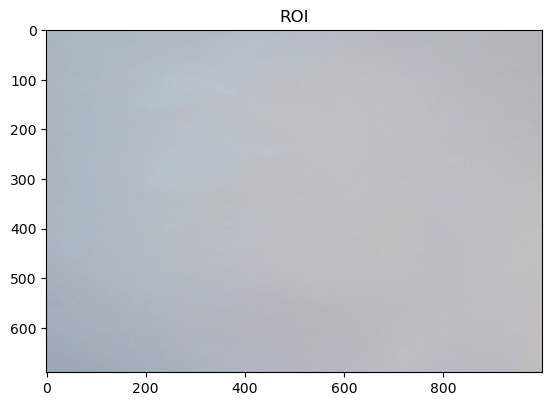

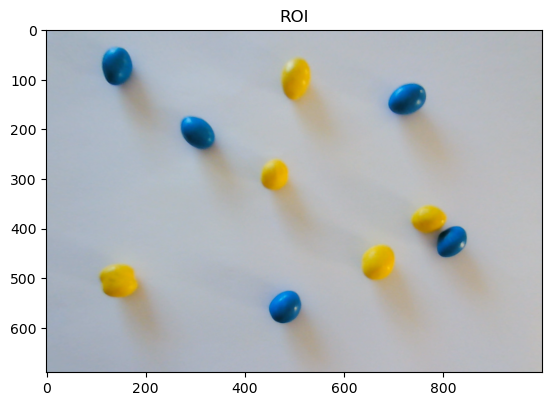

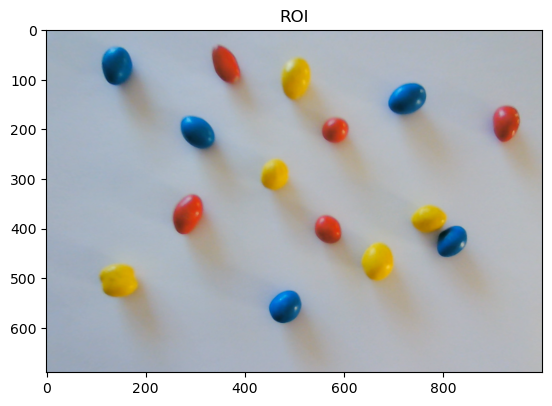

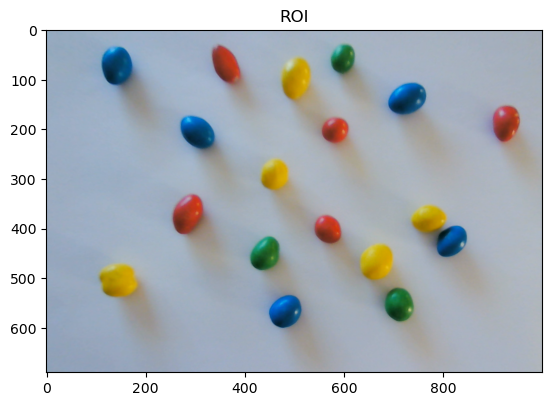

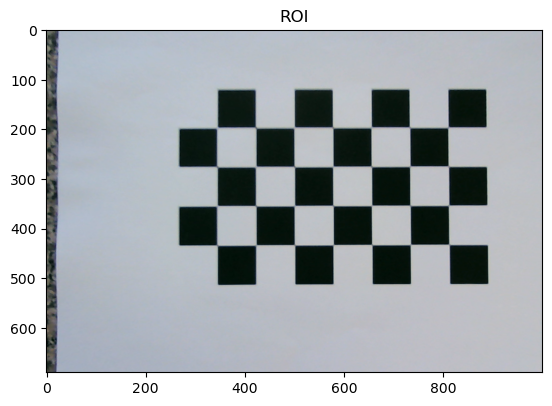

In [46]:
# Provide the path to the 'WhiteBackground' folder
folder_path = 'WhiteBackground_Undistorted'

# Provide the path to the output folder
output_folder = 'WhiteBackground_ROI'

# Loop through images in the folder and process each one
for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
        img_path = os.path.join(folder_path, filename)
        DefineROI(img_path)

#### **3.2** Calculate the **number of M&M per color** for all images provided
**AND**
##### **3.3.1** Show all peanuts that were detected. 

In [47]:
def DetectMMS(image, grey = False, contour_form="rectangle", min_contour_area = 100, show = False):

    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Convert the image to the HSV color space
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    color_codes_hsv = {
                        'Yellow': {
                            'lower': (90, 100, 50),
                            'upper': (100, 255, 255)
                        },
                        'Blue': {
                            'lower': (0, 100, 50),
                            'upper': (30, 255, 255)
                        },
                        'Red': {
                            'lower': (110, 100, 50),
                            'upper': (140, 255, 255)
                        },
                        'Green': {
                            'lower': (40, 100, 50),
                            'upper': (80, 255, 255)
                        },
                        'Brown': {
                            'lower': (100, 0, 0),
                            'upper': (255, 200, 150)
                        }
                    }

    color_codes_rgb = {'Yellow': (255, 255, 0),
                       'Blue': (0, 0, 255),
                       'Red': (255, 0, 0),
                       'Green': (0, 255, 0),
                    'Brown': (50, 25, 0)
                       }

    mms = {}

    colors = [['Blue', 'Yellow', 'Red', 'Green'] if not grey else ['Blue', 'Yellow', 'Red', 'Green', 'Brown']][0]

    for color in colors:
        # Define the lower and upper limits of the color
        lower = color_codes_hsv[color]['lower']
        upper = color_codes_hsv[color]['upper']

        # Create a mask for the color
        mask = cv2.inRange(img_hsv, lower, upper)
        kernel = np.ones((5, 5), np.uint8)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        min_contour_area = min_contour_area  # Adjust this threshold as needed
        mms[color] = []
        for contour in contours:
            if cv2.contourArea(contour) > min_contour_area:
                mms[color].append(contour)

        for contour in mms[color]:
            if(contour_form == "rectangle"):
              x, y, w, h = cv2.boundingRect(contour)
              cv2.rectangle(img, (x, y), (x + w, y + h), color_codes_rgb[color], 2)
            else:
              ellipse = cv2.fitEllipseDirect(contour)
              cv2.ellipse(img, ellipse, color_codes_rgb[color], 2)

    if show:
        plt.imshow(img)
        plt.title("M&M's Detection")
        plt.show()

    return mms


def ComputeNumberMMS(contours, grey=False):
    counts = {
        'Yellow': len(contours['Yellow']),
        'Blue': len(contours['Blue']),
        'Red': len(contours['Red']),
        'Green': len(contours['Green'])
    }

    if grey:
        counts['Brown'] = len(contours['Brown'])

    result_df = pd.DataFrame({'Number of M&M\'s': counts})
    display(result_df)

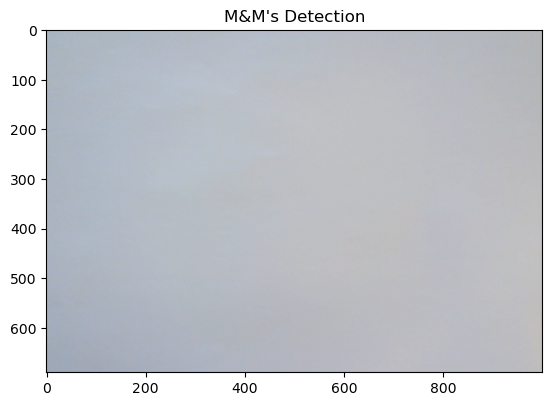

,Number of M&M's
Blue,0
Green,0
Red,0
Yellow,0


In [48]:
img = cv2.imread('WhiteBackground_ROI/calib_img 0.png')

mms_detected = DetectMMS(image = img, contour_form = "rectangle", show = True)
ComputeNumberMMS(mms_detected)

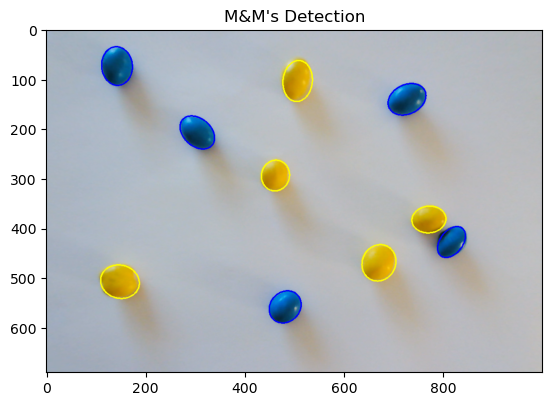

,Number of M&M's
Blue,5
Green,0
Red,0
Yellow,5


In [49]:
img = cv2.imread('WhiteBackground_ROI/calib_img 1.png')

mms_detected = DetectMMS(image = img, contour_form = "elipse", show = True)
ComputeNumberMMS(mms_detected)

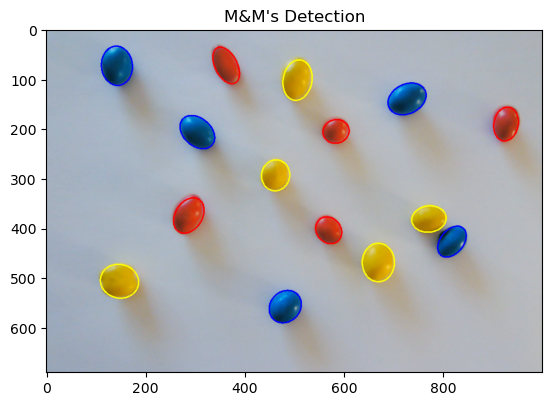

,Number of M&M's
Blue,5
Green,0
Red,5
Yellow,5


In [50]:
img = cv2.imread('WhiteBackground_ROI/calib_img 2.png')

mms_detected = DetectMMS(image = img, contour_form = "ellipse", show = True)
ComputeNumberMMS(mms_detected)

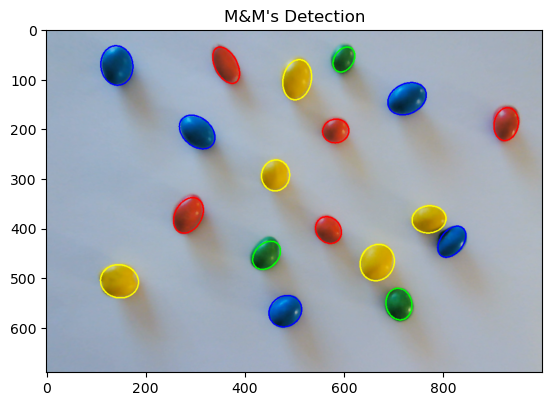

,Number of M&M's
Blue,5
Green,3
Red,5
Yellow,5


In [51]:
img = cv2.imread('WhiteBackground_ROI/calib_img 3.png')

mms_detected = DetectMMS(image = img, contour_form = "ellipse", show = True)
ComputeNumberMMS(mms_detected)

#### **3.3** Determine the **average area** for peanuts in pixels, considering the image “calib_img 3”. 

In [52]:
def ComputeAreaMMS(contours, contour_form = "rectangle", grey = False):
    areas = []
    colors = [['Blue', 'Yellow', 'Red', 'Green'] if not grey else ['Blue', 'Yellow', 'Red', 'Green', 'Brown']][0]
    for color in colors:
        for contour in contours[color]:
            if contour_form == "rectangle":
                center, sides, angle = cv2.minAreaRect(contour)
                areas.append(sides[0] * sides[1])
            else:
                ellipse = cv2.fitEllipseDirect(contour)
                # Extract ellipse parameters
                center, axes, angle = ellipse
                major_semi_axis = max(axes) / 2
                minor_semi_axis = min(axes) / 2
                # Calculate the area of the ellipse using the ellipse area formula
                area = np.pi * major_semi_axis * minor_semi_axis #Need to divide by 2 when dealing with axes (not semi-axes) as returned by fitEllipse
                areas.append(area)

    return round(np.mean(areas), 2)

In [53]:
img = cv2.imread('WhiteBackground_ROI/calib_img 3.png')
mms_detected_image3 = DetectMMS(image=img)

average_area_rectangles = ComputeAreaMMS(mms_detected_image3, contour_form ="rectangle" )
average_area_ellipses = ComputeAreaMMS(mms_detected_image3, contour_form ="ellipse")

# Create DataFrames with the results
results = pd.DataFrame({'Rectangles w/rotation': [average_area_rectangles], 'Ellipses': [average_area_ellipses]}, index=['Average Area (in pixels)'])

# Transpose the DataFrame to invert rows and columns
results = results.T

# Display the results with a title
display(HTML("<h2>Results for Average Areas for Rectangles and Ellipses</h2>"))
display(results)

,Average Area (in pixels)
Rectangles w/rotation,3929.77
Ellipses,2989.53


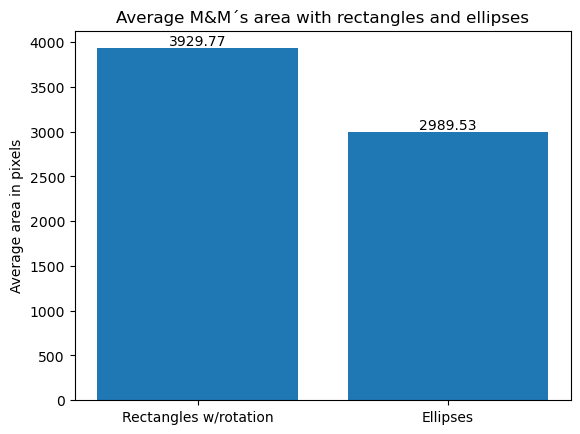

In [54]:
# Create a bar chart to visualize the averages
categories = ['Rectangles w/rotation', 'Ellipses']
average_areas = [average_area_rectangles, average_area_ellipses]

plt.bar(categories, average_areas)
plt.ylabel('Average area in pixels')
plt.title('Average M&M´s area with rectangles and ellipses')

# Add the values above the bars
for i, v in enumerate(average_areas):
    plt.text(i, v, str(round(v, 2)), ha='center', va='bottom')

plt.show()

##### **3.3.1** Show all peanuts that were detected (Also presented in the answer to the question **3.2**)

##### **3.3.2** Discuss the limitations of the peanut detection method used (in 2 sentences)

Regarding the limitations of the peanut detection method, it is important to note that:
1. Detection accuracy depends on **lighting, contrast and image quality**;
2. The method used in this code **assumes that peanuts are distinct and well-isolated objects**, which **may not be the case** in real situations where **peanuts may be close together or partially overlapping**.

#### **3.4** Determine the **average area** (and **standard deviation**) for peanuts in millimeters and grouped by color, considering images “calib_img 2” and “calib_img 3”.

##### **3.4.1** Show  the  result  in  a  table  color  vs  area  and  standard deviation. 

In [55]:
def ComputeAreaMetricMMS(contours, contour_form="rectangle", conversion_factor = 0.005, grey = False):
    areas = {}
    colors = [['Blue', 'Yellow', 'Red', 'Green'] if not grey else ['Blue', 'Yellow', 'Red', 'Green', 'Brown']][0]
    for color in colors:
        areas[color] = []
        for contour in contours[color]:
            if contour_form == "rectangle":
                center, sides, angle = cv2.minAreaRect(contour)
                areas[color].append(sides[0] * sides[1])
            else:
              if len(contour) >= 5:
                ellipse = cv2.fitEllipseDirect(contour)
                # Extract ellipse parameters
                center, axes, angle = ellipse
                major_semi_axis = max(axes) / 2
                minor_semi_axis = min(axes) / 2
                # Calculate the area of the ellipse using the ellipse area formula
                area = np.pi * major_semi_axis * minor_semi_axis #Need to divide by 2 when dealing with axes (not semi-axes) as returned by fitEllipse
                areas[color].append(area)

    # create a dictionary with the mean and standard deviation of the areas
    areas_mm = {}
    std_mm = {}
    for color in colors:
        areas_mm[color] = round(np.mean(areas[color]) * conversion_factor ** 2, 2) # Converts areas from pixels to mm squared
        std_mm[color] = round(np.std(areas[color]) * conversion_factor ** 2, 2) # Converts standard deviations from pixels to mm squared

    return areas_mm, std_mm

In [56]:
img = cv2.imread('WhiteBackground_ROI/calib_img 2.png')
mms_detected_image2 = DetectMMS(image = img)

areas_mm_rectangles, std_mm_rectangles = ComputeAreaMetricMMS(mms_detected_image2, contour_form="rectangle", conversion_factor = conversion_ratio)
areas_mm_ellipses, std_mm_ellipses = ComputeAreaMetricMMS(mms_detected_image2, contour_form="ellipse", conversion_factor = conversion_ratio)

results_rectangles = pd.DataFrame(areas_mm_rectangles, index=['Area (mm^2)'])
results_rectangles.loc['Standard deviation (mm^2)'] = std_mm_rectangles
results_ellipses = pd.DataFrame(areas_mm_ellipses, index=['Area (mm^2)'])
results_ellipses.loc['Standard deviation (mm^2)'] = std_mm_ellipses

# Display the results for rectangles with a title
display(HTML("<h2>Results for rectangles w/rotation</h2>"))
display(results_rectangles.T)

# Display results for ellipses with a title
display(HTML("<h2>Results for ellipses</h2>"))
display(results_ellipses.T)

,Area (mm^2),Standard deviation (mm^2)
Blue,343.94,41.11
Yellow,350.01,50.80
Red,278.81,57.28
Green,NaN,NaN


,Area (mm^2),Standard deviation (mm^2)
Blue,266.20,35.56
Yellow,274.19,43.46
Red,202.02,35.71
Green,NaN,NaN


In [57]:
img = cv2.imread('WhiteBackground_ROI/calib_img 3.png')
mms_detected_image3 = DetectMMS(image = img)

areas_mm_rectangles, std_mm_rectangles = ComputeAreaMetricMMS(mms_detected_image3, contour_form="rectangle", conversion_factor = conversion_ratio)
areas_mm_ellipses, std_mm_ellipses = ComputeAreaMetricMMS(mms_detected_image3, contour_form="ellipse", conversion_factor = conversion_ratio)

results_rectangles = pd.DataFrame(areas_mm_rectangles, index=['Area (mm^2)'])
results_rectangles.loc['Standard deviation (mm^2)'] = std_mm_rectangles
results_ellipses = pd.DataFrame(areas_mm_ellipses, index=['Area (mm^2)'])
results_ellipses.loc['Standard deviation (mm^2)'] = std_mm_ellipses

# Display the results for rectangles with a title
display(HTML("<h2>Results for rectangles w/rotation</h2>"))
display(results_rectangles.T)

# Display results for ellipses with a title
display(HTML("<h2>Results for ellipses</h2>"))
display(results_ellipses.T)

,Area (mm^2),Standard deviation (mm^2)
Blue,355.51,47.11
Yellow,341.64,52.32
Red,270.79,54.75
Green,237.80,49.85


,Area (mm^2),Standard deviation (mm^2)
Blue,270.77,41.58
Yellow,271.49,40.73
Red,198.75,34.66
Green,173.14,32.27


##### **3.4.2** Discuss  the  limitation  of  the  method  implemented  (in  2 sentences) 

The limitations of the implemented method are as follows:
1. **Sensitivity to lighting** conditions may affect color detection accuracy;
2. Potential inaccuracies in contour detection due to **variations in peanut shapes** may impact area calculations;
3. The method **assumes uniformity of peanut size**, which **may not hold in real-world scenarios** and potentially **affects standard deviation** estimates.

##### **3.5** Provide some recommendations that the M&M factory should take into  consideration to  improve  the  performance  of  the quality assurance  process  based  on  image  processing  (e.g.,  imaging setup, calibration process and photometric effects), in 4 sentences.

To enhance the performance of the quality assurance process based on image processing, the M&M factory should consider several key recommendations:
1. Optimizing the imaging setup is crucial; this includes ensuring **consistent and uniform lighting conditions** and employing **high-resolution cameras** to capture detailed images; 
2. A **meticulous calibration process is essential** for accurate measurements, and **regular recalibration** should be scheduled to account for any drift or changes in the system; 
3. Implementing advanced image processing techniques, such as **machine learning algorithms**, can **improve the accuracy and robustness** of peanut detection and color classification; 
4. **Addressing photometric effects**, like glare or reflections, through the use of polarizers or controlled lighting setups can significantly enhance the reliability of the quality assurance process.

### **4.** Consider the images retrieved from a ***Grey Background*** and repeat the previous point without defining a region of interest

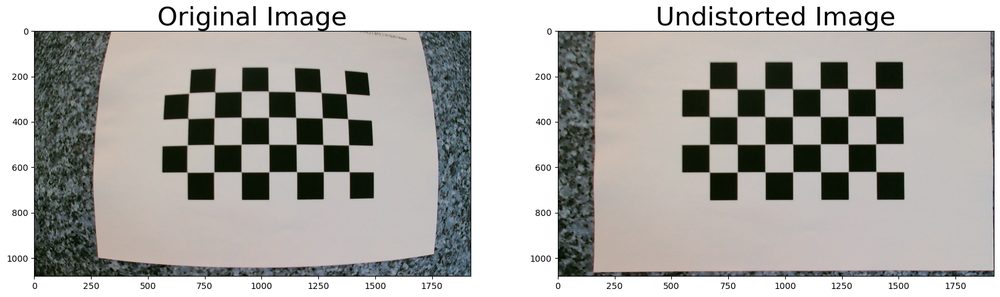

In [58]:
image_extrinsic = cv2.imread('GreyBackground/extrinsic.png')

intrinsic_matrix_grey, dist_coef_grey, rotation_vectors_grey, translation_vectors_grey = DistortedVSNonDistorted(objpoints = objpoints, imgpoints = imgpoints, image = image_extrinsic)

In [59]:
# Provide the path to the 'WhiteBackground' folder
folder_path = 'GreyBackground'

# Provide the path to the output folder
output_folder = 'GreyBackground_Undistorted'
      
# Loop through images in the folder and process each one
for filename in os.listdir(folder_path):
    if filename.endswith(".png"):
        img_path = os.path.join(folder_path, filename)
        process_image(img_path, intrinsic_matrix, dist_coef, output_folder)

### **4.1** Calculate the number of M&M per color for all images provided
**AND**
#### **4.2.1** Show all peanuts that were detected. 

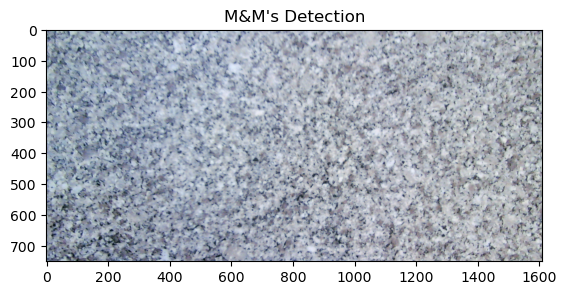

,Number of M&M's
Blue,0
Brown,0
Green,0
Red,0
Yellow,0


In [60]:
img = cv2.imread('GreyBackground_Undistorted/calib_img 0.png')

mms_detected = DetectMMS(image = img, contour_form = "rectangle", grey = True, min_contour_area = 600, show = True)
ComputeNumberMMS(mms_detected, grey = True)

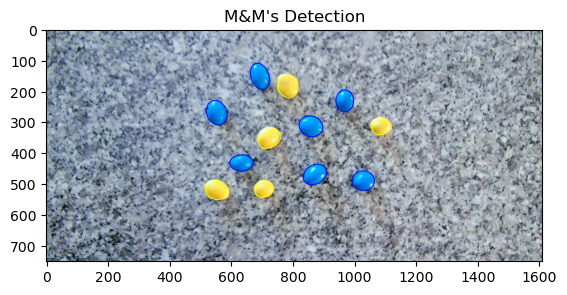

,Number of M&M's
Blue,7
Brown,0
Green,0
Red,0
Yellow,5


In [61]:
img = cv2.imread('GreyBackground_Undistorted/calib_img 1.png')

mms_detected = DetectMMS(image = img, contour_form = "ellipse", grey = True, min_contour_area = 600, show = True)
ComputeNumberMMS(mms_detected, grey = True)

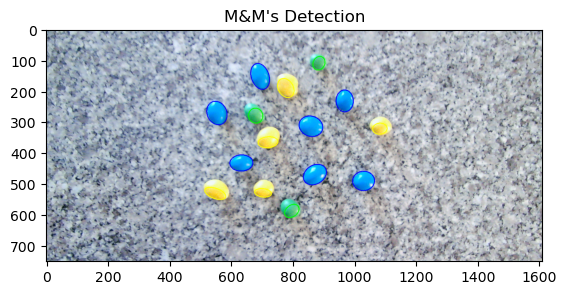

,Number of M&M's
Blue,7
Brown,0
Green,3
Red,0
Yellow,5


In [62]:
img = cv2.imread('GreyBackground_Undistorted/calib_img 2.png')

mms_detected = DetectMMS(image = img, contour_form = "ellipse", grey = True, min_contour_area = 600, show = True)
ComputeNumberMMS(mms_detected, grey = True)

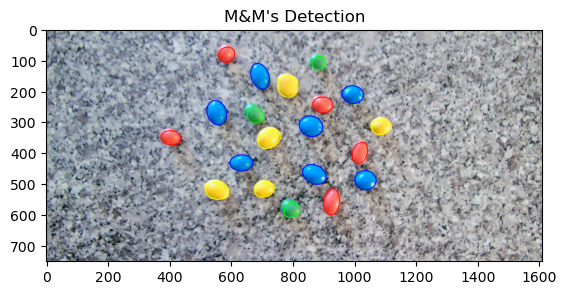

,Number of M&M's
Blue,7
Brown,0
Green,3
Red,5
Yellow,5


In [63]:
img = cv2.imread('GreyBackground_Undistorted/calib_img 3.png')

mms_detected = DetectMMS(image = img, contour_form = "ellipse", grey = True, min_contour_area = 600, show = True)
ComputeNumberMMS(mms_detected, grey = True)

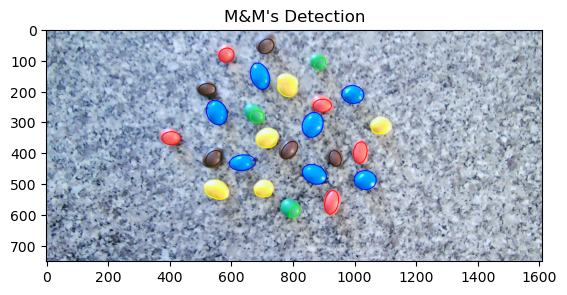

,Number of M&M's
Blue,7
Brown,5
Green,3
Red,5
Yellow,5


In [64]:
img = cv2.imread('GreyBackground_Undistorted/calib_img 4.png')

mms_detected = DetectMMS(image = img, contour_form = "ellipse", grey = True, min_contour_area = 600, show = True)
ComputeNumberMMS(mms_detected, grey = True)

In [65]:
def DetectMMS_Watershed(image, min_contour_area = 100, show = False):

    img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Convert the image to the HSV color space
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    color_codes_hsv = {
                        'Yellow': {
                            'lower': (80, 0, 200),
                            'upper': (100, 255, 255)
                        },
                        'Blue': {
                            'lower': (0, 150, 0),
                            'upper': (30, 255, 255)
                        },
                        'Red': {
                            'lower': (110, 100, 50),
                            'upper': (140, 255, 255)
                        },
                        'Green': {
                            'lower': (40, 90, 50),
                            'upper': (80, 255, 255)
                        },
                        'Brown': {
                            'lower': (90, 0, 0),
                            'upper': (255, 255, 133)
                        }
                    }
    
    color_codes_rgb = {'Yellow': (255, 255, 0),
                       'Blue': (0, 0, 255),
                       'Red': (255, 0, 0),
                       'Green': (0, 255, 0),
                       'Brown': (50, 25, 0)
                       }

    colors = ['Blue', 'Yellow', 'Red', 'Green', 'Brown']

    mms = {}

    sure_bg = np.zeros(img.shape[:2], dtype="uint8")
    sure_fg = np.zeros(img.shape[:2], dtype="uint8")

    for color in colors:
        # Define the lower and upper limits of the color
        lower = color_codes_hsv[color]['lower']
        upper = color_codes_hsv[color]['upper']

        # Create a mask for the color
        mask_color = cv2.inRange(img_hsv, lower, upper)
        kernel_erode = np.ones((3, 3), np.uint8)
        kernel_dilate = np.ones((6, 6), np.uint8)
        sure_fg = cv2.morphologyEx(mask_color, cv2.MORPH_ERODE, kernel_erode, iterations = 4)
        mask_color = cv2.morphologyEx(sure_fg, cv2.MORPH_DILATE, kernel_dilate, iterations = 2)
        sure_bg = cv2.morphologyEx(mask_color, cv2.MORPH_DILATE, kernel_dilate, iterations = 5)

        # Finding unknown region
        sure_fg = np.uint8(sure_fg)
        unknown = cv2.subtract(sure_bg, sure_fg)

        # Marker labelling
        ret, markers = cv2.connectedComponents(sure_fg, 4, cv2.CV_32S)

        # Add one to all labels so that sure background is not 0, but 1
        markers = markers + 1

        # Now, mark the region of unknown with zero
        markers[unknown == 255] = 0

        # Apply the watershed algorithm
        markers = cv2.watershed(img, markers)

        # Create a copy of the image
        img_copy = img.copy()

        # Iterate over the markers and apply a different color for each one
        for marker in np.unique(markers):
            if marker > 0:
                img_copy[markers == marker] = np.random.randint(255, size = 3)

        # Create a binary mask from the markers
        object_mask = np.zeros_like(markers, dtype=np.uint8)
        object_mask[markers > 1] = 255  # Set regions with labels greater than 1 to 255
        object_mask = cv2.morphologyEx(object_mask, cv2.MORPH_ERODE, kernel_erode, iterations = 2)

        contours, _ = cv2.findContours(object_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        min_contour_area = min_contour_area  # Adjust this threshold as needed
        mms[color] = []
        for contour in contours:
            if cv2.contourArea(contour) > min_contour_area:
                mms[color].append(contour)

        # Draw rectangles around the M&M's
        for contour in mms[color]:
            x, y, w, h = cv2.boundingRect(contour)
            cv2.rectangle(img, (x, y), (x + w, y + h), color_codes_rgb[color], 2)

    if show:
        plt.imshow(img)
        plt.title("M&M´s Detection")
        plt.show()

    return mms

In [66]:
img = cv2.imread('/content/GreyBackground_Undistorted/calib_img 5.png')

print(Fore.BLACK + Style.BRIGHT + "M&M's detection without Watershed:")
mms_detected_without_watershed = DetectMMS(image = img, contour_form = "ellipse", grey = True, min_contour_area = 600, show = True)
print("")
print(Fore.BLACK + Style.BRIGHT + "M&M's detection with Watershed:")
mms_detected_with_watershed = DetectMMS_Watershed(image = img, contour_form = "ellipse", grey = True, min_contour_area = 600, show = True)
print("")
ComputeNumberMMS(mms_detected_with_watershed, grey = True)

M&M's detection without Watershed:


error: OpenCV(4.8.1) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


### **4.2** Determine the average area for peanuts in pixels, considering the image “calib_img 3”

In [67]:
img = cv2.imread('GreyBackground_Undistorted/calib_img 3.png')
mms_detected_image3 = DetectMMS(image = img, grey = True, min_contour_area = 600)

average_area_rectangles_grey = ComputeAreaMMS(mms_detected_image3, contour_form ="rectangle" )
average_area_ellipses_grey = ComputeAreaMMS(mms_detected_image3, contour_form ="ellipse")

# Create DataFrames with the results
results = pd.DataFrame({'Rectangles': [average_area_rectangles_grey], 'Ellipses': [average_area_ellipses_grey]}, index=['Average Area (in pixels)'])

# Transpose the DataFrame to invert rows and columns
results = results.T

# Display the results with a title
display(HTML("<h2>Results for Average Areas for Rectangles and Ellipses</h2>"))
display(results)

,Average Area (in pixels)
Rectangles,3989.92
Ellipses,2909.91


### **4.2.1** Show all peanuts that were detected (Also presented in the answer to the question **4.1**)

### **4.2.2** Discuss  the  limitation  of  the  method  implemented  (in  2 sentences)

The limitations of the implemented method are as follows:
1. **Sensitivity to lighting** conditions may affect color detection accuracy;
2. Potential inaccuracies in contour detection due to **variations in peanut shapes** may impact area calculations;
3. The method **assumes uniformity of peanut size**, which **may not hold in real-world scenarios** and potentially **affects standard deviation** estimates.

### **4.3** Determine the average area (and standard deviation) for peanuts in millimeters and grouped by color, considering images “calib_img 2” and “calib_img 3”

In [68]:
img = cv2.imread('GreyBackground_Undistorted/calib_img 2.png')
mms_detected_image2 = DetectMMS(image = img, grey = True, min_contour_area = 600)

areas_mm_rectangles, std_mm_rectangles = ComputeAreaMetricMMS(mms_detected_image2, contour_form="rectangle", conversion_factor = conversion_ratio)
areas_mm_ellipses, std_mm_ellipses = ComputeAreaMetricMMS(mms_detected_image2, contour_form="ellipse", conversion_factor = conversion_ratio)

results_rectangles = pd.DataFrame(areas_mm_rectangles, index=['Area (mm^2)'])
results_rectangles.loc['Standard deviation (mm^2)'] = std_mm_rectangles
results_ellipses = pd.DataFrame(areas_mm_ellipses, index=['Area (mm^2)'])
results_ellipses.loc['Standard deviation (mm^2)'] = std_mm_ellipses

# Display the results for rectangles with a title
display(HTML("<h2>Results for rectangles</h2>"))
display(results_rectangles.T)

# Display results for ellipses with a title
display(HTML("<h2>Results for ellipses</h2>"))
display(results_ellipses.T)

,Area (mm^2),Standard deviation (mm^2)
Blue,378.00,37.43
Yellow,195.19,44.96
Red,NaN,NaN
Green,188.85,27.60


,Area (mm^2),Standard deviation (mm^2)
Blue,283.28,27.45
Yellow,136.10,36.26
Red,NaN,NaN
Green,120.22,12.80


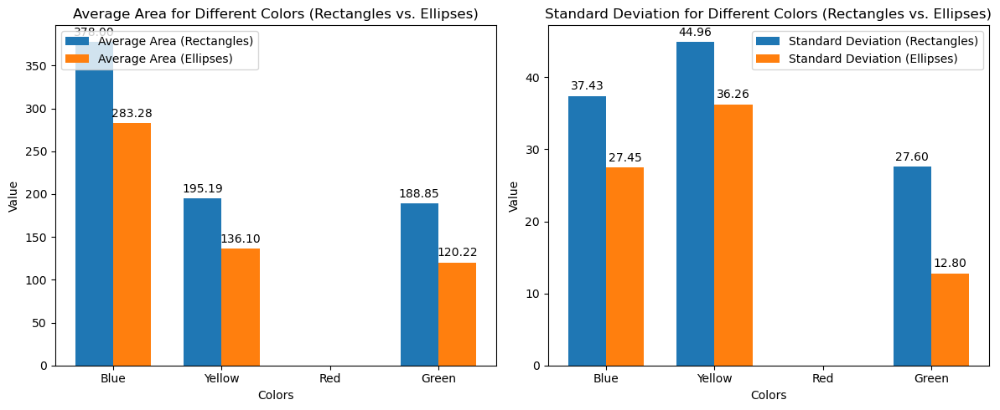

In [69]:
# Select the colors you want to include in the graph
selected_colors = ['Blue', 'Yellow', 'Red', 'Green']  # Add additional colors if needed

# Data for average area and standard deviation for the selected colors
average_area_rectangles = [areas_mm_rectangles[color] for color in selected_colors]
std_dev_rectangles = [std_mm_rectangles[color] for color in selected_colors]
average_area_ellipses = [areas_mm_ellipses[color] for color in selected_colors]
std_dev_ellipses = [std_mm_ellipses[color] for color in selected_colors]

# Labels for the graph
labels = ['Rectangles', 'Ellipses']

# Width of the bars
bar_width = 0.35
x = np.arange(len(selected_colors))

# Create a stacked bar chart for average area
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

rectangles_avg = ax1.bar(x - bar_width/2, average_area_rectangles, bar_width, label='Average Area (Rectangles)')
ellipses_avg = ax1.bar(x + bar_width/2, average_area_ellipses, bar_width, label='Average Area (Ellipses)')

ax1.set_xlabel('Colors')
ax1.set_ylabel('Value')
ax1.set_title('Average Area for Different Colors (Rectangles vs. Ellipses)')
ax1.set_xticks(x)
ax1.set_xticklabels(selected_colors)
ax1.legend()

# Create a stacked bar chart for standard deviation
rectangles_std = ax2.bar(x - bar_width/2, std_dev_rectangles, bar_width, label='Standard Deviation (Rectangles)')
ellipses_std = ax2.bar(x + bar_width/2, std_dev_ellipses, bar_width, label='Standard Deviation (Ellipses)')

ax2.set_xlabel('Colors')
ax2.set_ylabel('Value')
ax2.set_title('Standard Deviation for Different Colors (Rectangles vs. Ellipses)')
ax2.set_xticks(x)
ax2.set_xticklabels(selected_colors)
ax2.legend()

# Add values above the columns
def add_values(rects, ax):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}', xy=(rect.get_x() + rect.get_width() / 2, height), xytext=(0, 3),
                    textcoords="offset points", ha='center', va='bottom')

add_values(rectangles_avg, ax1)
add_values(ellipses_avg, ax1)
add_values(rectangles_std, ax2)
add_values(ellipses_std, ax2)

plt.tight_layout()
plt.show()

In [70]:
img = cv2.imread('GreyBackground_Undistorted/calib_img 3.png')
mms_detected_image3 = DetectMMS(image = img, grey = True, min_contour_area = 600)

areas_mm_rectangles, std_mm_rectangles = ComputeAreaMetricMMS(mms_detected_image3, contour_form="rectangle", conversion_factor = conversion_ratio)
areas_mm_ellipses, std_mm_ellipses = ComputeAreaMetricMMS(mms_detected_image3, contour_form="ellipse", conversion_factor = conversion_ratio)

results_rectangles = pd.DataFrame(areas_mm_rectangles, index=['Area (mm^2)'])
results_rectangles.loc['Standard deviation (mm^2)'] = std_mm_rectangles
results_ellipses = pd.DataFrame(areas_mm_ellipses, index=['Area (mm^2)'])
results_ellipses.loc['Standard deviation (mm^2)'] = std_mm_ellipses

# Display the results for rectangles with a title
display(HTML("<h2>Results for rectangles</h2>"))
display(results_rectangles.T)

# Display results for ellipses with a title
display(HTML("<h2>Results for ellipses</h2>"))
display(results_ellipses.T)

,Area (mm^2),Standard deviation (mm^2)
Blue,371.38,32.86
Yellow,324.98,40.88
Red,279.31,50.08
Green,214.48,32.29


,Area (mm^2),Standard deviation (mm^2)
Blue,281.35,28.17
Yellow,230.26,44.01
Red,204.04,34.57
Green,142.63,21.01


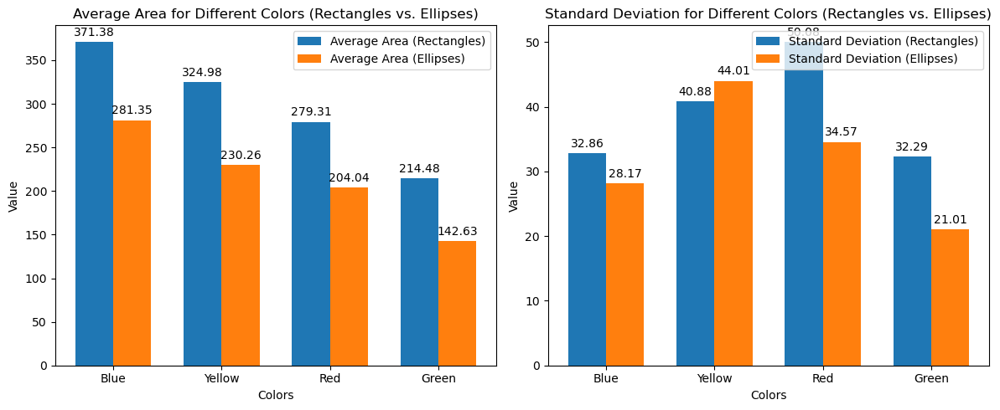

In [71]:
# Select the colors you want to include in the graph
selected_colors = ['Blue', 'Yellow', 'Red', 'Green']  # Add additional colors if needed

# Data for average area and standard deviation for the selected colors
average_area_rectangles = [areas_mm_rectangles[color] for color in selected_colors]
std_dev_rectangles = [std_mm_rectangles[color] for color in selected_colors]
average_area_ellipses = [areas_mm_ellipses[color] for color in selected_colors]
std_dev_ellipses = [std_mm_ellipses[color] for color in selected_colors]

# Labels for the graph
labels = ['Rectangles', 'Ellipses']

# Width of the bars
bar_width = 0.35
x = np.arange(len(selected_colors))

# Create a stacked bar chart for average area
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

rectangles_avg = ax1.bar(x - bar_width/2, average_area_rectangles, bar_width, label='Average Area (Rectangles)')
ellipses_avg = ax1.bar(x + bar_width/2, average_area_ellipses, bar_width, label='Average Area (Ellipses)')

ax1.set_xlabel('Colors')
ax1.set_ylabel('Value')
ax1.set_title('Average Area for Different Colors (Rectangles vs. Ellipses)')
ax1.set_xticks(x)
ax1.set_xticklabels(selected_colors)
ax1.legend()

# Create a stacked bar chart for standard deviation
rectangles_std = ax2.bar(x - bar_width/2, std_dev_rectangles, bar_width, label='Standard Deviation (Rectangles)')
ellipses_std = ax2.bar(x + bar_width/2, std_dev_ellipses, bar_width, label='Standard Deviation (Ellipses)')

ax2.set_xlabel('Colors')
ax2.set_ylabel('Value')
ax2.set_title('Standard Deviation for Different Colors (Rectangles vs. Ellipses)')
ax2.set_xticks(x)
ax2.set_xticklabels(selected_colors)
ax2.legend()

# Add values above the columns
def add_values(rects, ax):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}', xy=(rect.get_x() + rect.get_width() / 2, height), xytext=(0, 3),
                    textcoords="offset points", ha='center', va='bottom')

add_values(rectangles_avg, ax1)
add_values(ellipses_avg, ax1)
add_values(rectangles_std, ax2)
add_values(ellipses_std, ax2)

plt.tight_layout()
plt.show()

### **4.4** Provide some recommendations that the M&M factory should take into  consideration to  improve  the  performance  of  the quality assurance  process  based  on  image  processing  (e.g.,  imaging setup, calibration process and photometric effects), in 4 sentences.

To enhance the performance of the quality assurance process based on image processing, the M&M factory should consider several key recommendations:
1. Optimizing the imaging setup is crucial; this includes ensuring **consistent and uniform lighting conditions** and employing **high-resolution cameras** to capture detailed images; 
2. A **meticulous calibration process is essential** for accurate measurements, and **regular recalibration** should be scheduled to account for any drift or changes in the system; 
3. Implementing advanced image processing techniques, such as **machine learning algorithms**, can **improve the accuracy and robustness** of peanut detection and color classification; 
4. **Addressing photometric effects**, like glare or reflections, through the use of polarizers or controlled lighting setups can significantly enhance the reliability of the quality assurance process.